# Analysis of the Impact of BoC actions on Canadian Banking sector through COVID-19

Presenters: 
- Amar Munipalle
- Alexandra Hu
- Nitesh Jain
- Shuran Xu





## Background of Covid 19 and the Economy
The COVID-19 pandemic represents a serious health threat to people around the world and a significant disruption to daily life. It is having a major impact on the global and Canadian economies. Every sector of the Canadian economy is affected. Some sectors, such as the energy, travel and hospitality, and service industries, are being particularly hard hit.

The public health actions needed to contain the spread of the virus, such as school closures, states of emergency, and social distancing measures, while necessary, are themselves going to significantly impact economic activity.

However, it’s important to underscore that while the impact is large, it will be temporary. Authorities around the world have taken bold and necessary measures to contain the spread of the virus and to support people and businesses through a very challenging time.

## 1. Actions taken by Bank of Canada

- Government of Canada Bond Purchase Program (GBPP)

- Canada Mortgage Bond Purchase Program (CMBP)

- Bankers’ Acceptance Purchase Facility (BAPF)

- Provincial Bond Purchase Program (PBPP)

- Corporate Bond Purchase Program (CBPP)

- Commercial Paper Purchase Program (CPPP)

- Contingent Term Repo Facility (CTRF)


## 1.1 Preparation

Bank of Canada provides api to their database: PyValet
documentation https://www.bankofcanada.ca/valet/docs

In [1]:
! pip install  pyvalet

In [2]:
# Import the libraries
import pandas as pd
import numpy as np
from pyvalet import ValetInterpreter
import datetime as dt
import hvplot.pandas
import plotly.express as px
vi = ValetInterpreter()

### 1.2 Visual Representation of Action Data

In [3]:
# Extract the data from Bank of Canada's Valet API
df1 = vi.get_group_observations("B2_WEEKLY", response_format='csv')

# Drop the columns not used in Quantitative Easing and rename the ones used
df2 = df1.rename(columns=
           {list(df1)[0]:'date',
           "V36612" : "Treasury Bills",
           "V36613" : "Government of Canada Bonds",
           "V1160788296" : "Real Return Bonds",
           "V1038114416" : "Canada Mortgage Bonds",
           "v1146067261" : "Provincial Money Market",
           "v1154426989" : "Provincial Bonds",
           "v1146067262" : "Bankers Acceptance",
           "v1146067263" : "Commercial Paper",
           "v1154426990" : "Corporate Bonds",
           "V44201362" : "Securities Purchased under Resale Agreement",
           "V36610" : "Total Assets"
           }).drop(columns=["V36634", 
                            "V36635", "V36636", "V36632", "V36624", "V36625", "V36628", "v1146067264"])

#Set the date as index and convert it to Datetime Object from String Object
assets_df = df2.set_index('date')
assets_df.index = pd.to_datetime(assets_df.index)

# Export the data to excel
#df2.to_excel('balance_sheet_weekly.xlsx')

#PLot the hvplot for visual representation
assets_df_plot = assets_df.hvplot.line(x = "date", width= 1000, height = 500, rot =90).opts(yformatter="%.0f")
assets_df_plot

:NdOverlay   [Variable]
   :Curve   [date]   (value)

## 2. Stock Prices 

## 2.1 Preparation

In [1]:
# Import libraries and dependencies
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import alpaca_trade_api as tradeapi
%matplotlib inline

In [2]:
# Load .env enviroment variables
from dotenv import load_dotenv
load_dotenv("sample.env")
# Set Alpaca API key and secret
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

api = tradeapi.REST(alpaca_api_key, alpaca_secret_key, api_version="v2")


In [3]:
# Get all Asstes
assets = api.list_assets()

# Keep only tradeable assets
tradeable = [asset for asset in assets if asset.tradable ]
#tradeable

In [4]:
# Create a new empty DataFrame
asset_info_df = pd.DataFrame()
asset_info_df["symbol"] = pd.Series([asset.symbol for asset in assets])
#asset_info_df.sort_values("symbol", inplace=True)
# Display the first 10 asset tickers
display(asset_info_df.head(10))

,symbol
0,A
1,AACH
2,AAME
3,AAOI
4,AAP
5,AAU
6,ABEV
7,ACGLO
8,ACGLP
9,ADT


In [5]:
# Set the ticker
ticker = input("Enter the ticker to run the Monte Carlo Simulation")

# Set timeframe to "1D"
timeframe = "1D"

# Set start and end datetimes of 1 year, between now and 365 days ago.
start_date = pd.Timestamp("2019-01-01", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2020-03-20", tz="America/New_York").isoformat()

# Get 1 year"s worth of historical data for TD
df = api.get_barset(
    ticker,
    timeframe,
    limit=None,
    start=start_date,
    end=end_date,
    after=None,
    until=None,
).df

df.tail()

Enter the ticker to run the Monte Carlo Simulation A


A                              
                            open   high    low  close   volume
time                                                          
2020-03-16 00:00:00-04:00  61.13  66.62  61.13  64.12  4339414
2020-03-17 00:00:00-04:00  66.02  70.53  63.94  70.50  2933856
2020-03-18 00:00:00-04:00  65.19  69.88  65.18  69.38  3227657
2020-03-19 00:00:00-04:00  68.54  68.59  64.17  65.76  2968209
2020-03-20 00:00:00-04:00  65.99  71.00  64.96  66.46  2838751

In [6]:
# Drop Outer Table Level
df = df.droplevel(axis=1, level=0)


# Use the drop function to drop extra columns
df.drop(columns=["open", "high", "low", "volume"], inplace=True)


# Since this is daily data, we can keep only the date (remove the time) component of the data
df.index = df.index.date

df.tail()

,close
2020-03-16,64.12
2020-03-17,70.50
2020-03-18,69.38
2020-03-19,65.76
2020-03-20,66.46


In [7]:
# Use the `pct_change` function to calculate daily returns of BB
daily_returns = df.pct_change()

# Use the `mean` function to calculate the mean of daily returns for BB
avg_daily_return = daily_returns.mean()["close"]

# Use the `std` function to calculate the standard deviation of daily returns for BB
std_dev_daily_return = daily_returns.std()["close"]

In [8]:
# Set number of trading days and get last closing price of TSLA from DataFrame
num_simulations = 1000
num_trading_days = 252 
stock_last_price = df['close'][-1]
# Initialize empty DataFrame to hold simulated prices for each simulation
simulated_price_df = pd.DataFrame()

# Run the simulation of projecting stock prices for the next trading year, `1000` times
for n in range(num_simulations):
    # Initialize the simulated prices list with the last closing price of TSLA
    simulated_ticker_prices = [stock_last_price]

        # Simulate the returns for 252  trading days
    for i in range(num_trading_days):
        # Calculate the simulated price using the last price within the list
        simulated_price = simulated_ticker_prices[-1] * (1 + np.random.normal(avg_daily_return, std_dev_daily_return))
        # Append the simulated price to the list
        simulated_ticker_prices.append(simulated_price)
    
    # Append the simulated prices of each simulation to DataFrame
    simulated_price_df[f"Simulation {n+1}"] = pd.Series(simulated_ticker_prices)

# Print head of DataFrame
simulated_price_df.head()

,Simulation 1,Simulation 2,Simulation 3,Simulation 4,Simulation 5,Simulation 6,Simulation 7,Simulation 8,Simulation 9,Simulation 10,...,Simulation 991,Simulation 992,Simulation 993,Simulation 994,Simulation 995,Simulation 996,Simulation 997,Simulation 998,Simulation 999,Simulation 1000
0,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,...,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000,66.460000
1,66.963971,69.747910,65.341293,67.460357,63.723510,65.420413,66.733197,66.978904,68.558752,67.402659,...,64.535422,65.299844,66.834661,65.514280,68.702354,65.649890,64.219993,63.839616,65.096062,67.073113
2,67.365602,70.956055,64.101601,65.826140,64.182321,65.892536,65.977247,65.885665,68.994565,64.261492,...,62.521516,66.685905,67.098632,65.716224,67.793424,65.524667,65.990001,62.069757,63.199924,68.177174
3,68.308739,69.748529,66.610029,64.721775,62.883489,65.663383,64.972551,66.191325,68.571689,64.732627,...,63.166309,66.468077,67.551915,67.241046,67.381019,68.275773,64.912128,62.951231,62.048254,67.318944
4,68.186733,69.443466,65.168982,64.500506,62.821034,66.951017,65.821510,65.291674,67.745639,66.011622,...,63.403301,66.988553,67.401456,68.349858,65.870164,70.507761,62.605591,63.801296,64.337177,69.062830


## 2.2 Stock Price Trajectory Simulation

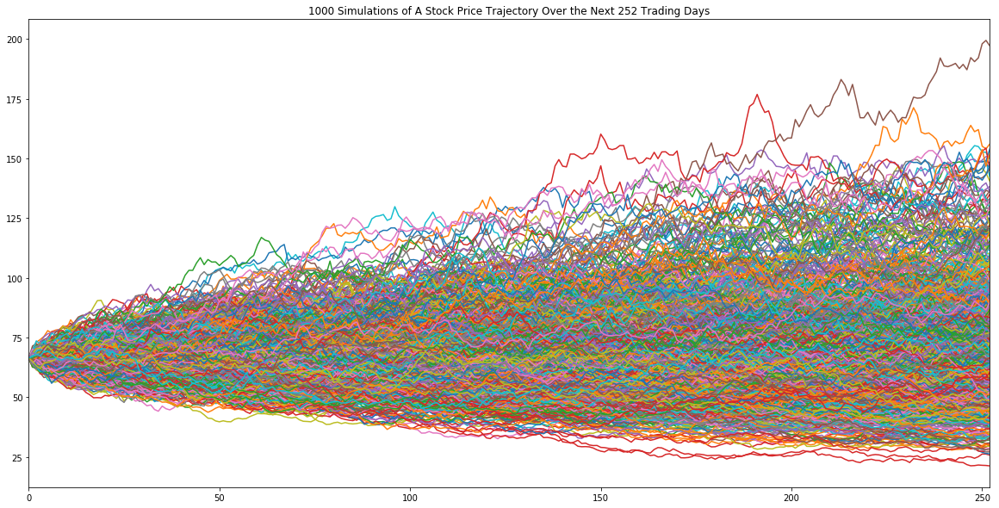

In [9]:
# Use the `plot` function to plot the trajectory of TSLA stock based on a 252 * 3 trading day simulation
plot_title = f"{n+1} Simulations of {ticker} Stock Price Trajectory Over the Next 252 Trading Days"
simulated_price_df.plot(legend=None, title=plot_title, figsize =[20,10])

In [10]:
# Select the last row for projecting stock prices (prices of each simulation on the last simulated trading day)
simulated_ending_prices = simulated_price_df.iloc[-1, :]
simulated_ending_prices.head()

Simulation 1    121.503935
Simulation 2     60.219002
Simulation 3     56.850707
Simulation 4     61.721430
Simulation 5     50.779013
Name: 252, dtype: float64

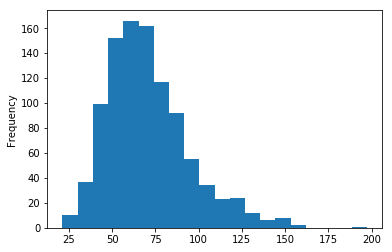

In [11]:
# Use the `plot` function to plot a frequency distribution of simulated ending prices
simulated_ending_prices.plot(kind='hist', bins=20)

In [12]:
# Use the `value_counts` function to create the frequency distribution and 
# sort the data into 20 bins. Divide the value counts of each bin by the total
# number of prices to return the probability of each range
simulated_ending_prices.value_counts(bins=20) / len(simulated_ending_prices)

(56.467, 65.26]       0.166
(65.26, 74.054]       0.162
(47.673, 56.467]      0.152
(74.054, 82.847]      0.117
(38.88, 47.673]       0.099
(82.847, 91.64]       0.092
(91.64, 100.434]      0.055
(30.086, 38.88]       0.037
(100.434, 109.227]    0.034
(118.021, 126.814]    0.024
(109.227, 118.021]    0.023
(126.814, 135.607]    0.012
(21.116, 30.086]      0.010
(144.401, 153.194]    0.008
(135.607, 144.401]    0.006
(153.194, 161.988]    0.002
(188.368, 197.161]    0.001
(179.574, 188.368]    0.000
(161.988, 170.781]    0.000
(170.781, 179.574]    0.000
Name: 252, dtype: float64

In [13]:
# Use the `quantile` function to calculate the 95% confidence interval for simulated ending prices
confidence_interval = simulated_ending_prices.quantile(q=[0.025, 0.975])
confidence_interval

0.025     33.874018
0.975    129.165596
Name: 252, dtype: float64

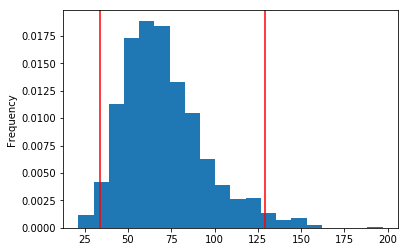

In [14]:
# Use the `plot` function to create a probability distribution histogram of simulated ending prices
# with markings for a 95% confidence interval
plt.figure();
simulated_ending_prices.plot(kind='hist', density=True, bins=20)
plt.axvline(confidence_interval.iloc[0], color='r')
plt.axvline(confidence_interval.iloc[1], color='r')

In [15]:
# Set timeframe to "1D"
timeframe = "1D"

# Set the dates for the price of the desired stock for 20 July 2020
start_date = pd.Timestamp("2020-07-19", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2020-07-20", tz="America/New_York").isoformat()

# Get actual stock price for the desired stock on 20th July 2020
df = api.get_barset(
    ticker,
    timeframe,
    limit=None,
    start=start_date,
    end=end_date,
    after=None,
    until=None,
).df

df

A                              
                            open   high    low  close   volume
time                                                          
2020-07-20 00:00:00-04:00  94.91  96.22  94.76  95.19  1114205

## 3.Analysis of Banks
## 3.1 Preparation

In [1]:
! pip install finquant

In [2]:
from finquant.portfolio import build_portfolio
from finquant.efficient_frontier import EfficientFrontier
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.signal import find_peaks
import hvplot.pandas  
import hvplot.dask
from plotly.subplots import make_subplots

## 3.2 Small Banks

[*********************100%***********************]  4 of 4 completed
the weights for maximum sharpe ratio =         Allocation
LB.TO     0.294914
CWB.TO    0.358543
EQB.TO    0.278550
HCG.TO    0.067994
the weights for minimum volatility =         Allocation
LB.TO     0.556378
CWB.TO    0.224394
EQB.TO    0.206375
HCG.TO    0.012853


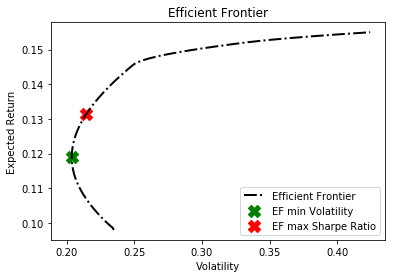

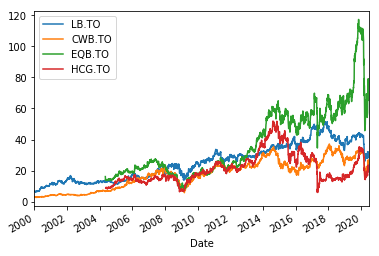

In [3]:
# Efficient Frontier for small banks for 2020-06-30
small_banks = ['LB.TO', 'CWB.TO', 'EQB.TO', 'HCG.TO']
start_date = datetime.datetime(2000, 1, 1)
end_date = datetime.datetime(2020, 6, 30)
small_banks_pf = build_portfolio(names=small_banks, start_date=start_date, end_date=end_date, data_api="yfinance")
print(f"the weights for maximum sharpe ratio = {small_banks_pf.ef_maximum_sharpe_ratio(verbose=False)}")
print(f"the weights for minimum volatility = {small_banks_pf.ef_minimum_volatility(verbose=False)}")

small_banks_pf.ef_plot_efrontier()
# adding markers to optimal solutions
small_banks_pf.ef_plot_optimal_portfolios()
# perform visualization on prices on small banks
small_banks_pf.data.plot()
plt.show()

[*********************100%***********************]  4 of 4 completed
the weights for maximum sharpe ratio =         Allocation
LB.TO     0.365194
CWB.TO    0.309717
EQB.TO    0.250638
HCG.TO    0.074450
the weights for minimum volatility =         Allocation
LB.TO     0.533667
CWB.TO    0.222728
EQB.TO    0.224608
HCG.TO    0.018997


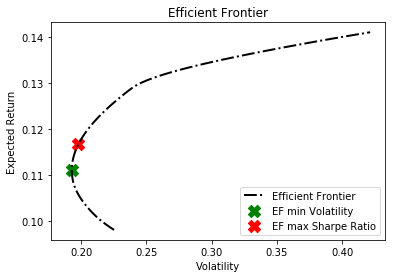

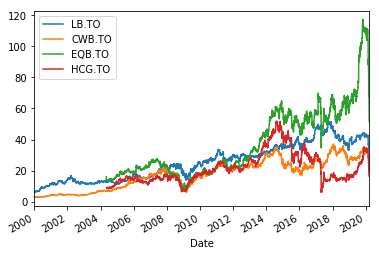

In [4]:
# Efficient Frontier for small banks for 2020-03-23
small_banks = ['LB.TO', 'CWB.TO', 'EQB.TO', 'HCG.TO']
start_date = datetime.datetime(2000, 1, 1)
end_date = datetime.datetime(2020, 3, 23)
small_banks_pf = build_portfolio(names=small_banks, start_date=start_date, end_date=end_date, data_api="yfinance")
print(f"the weights for maximum sharpe ratio = {small_banks_pf.ef_maximum_sharpe_ratio(verbose=False)}")
print(f"the weights for minimum volatility = {small_banks_pf.ef_minimum_volatility(verbose=False)}")
small_banks_pf.ef_plot_efrontier()
# adding markers to optimal solutions
small_banks_pf.ef_plot_optimal_portfolios()
# perform visualization on prices on small banks
small_banks_pf.data.plot()
plt.show()

[*********************100%***********************]  4 of 4 completed
the weights for maximum sharpe ratio =         Allocation
LB.TO     0.350895
CWB.TO    0.277732
EQB.TO    0.293266
HCG.TO    0.078107
the weights for minimum volatility =         Allocation
LB.TO     0.536214
CWB.TO    0.212456
EQB.TO    0.232109
HCG.TO    0.019221


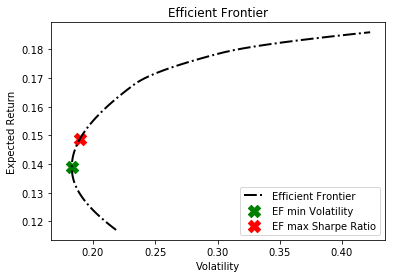

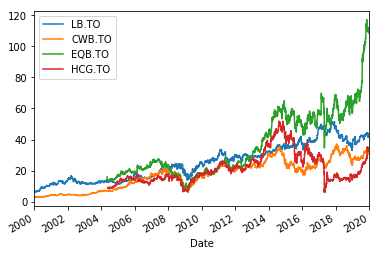

In [5]:
# Efficient Frontier for small banks for 2020-01-01
small_banks = ['LB.TO', 'CWB.TO', 'EQB.TO', 'HCG.TO']
start_date = datetime.datetime(2000, 1, 1)
end_date = datetime.datetime(2020, 1, 1)
small_banks_pf = build_portfolio(names=small_banks, start_date=start_date, end_date=end_date, data_api="yfinance")
print(f"the weights for maximum sharpe ratio = {small_banks_pf.ef_maximum_sharpe_ratio(verbose=False)}")
print(f"the weights for minimum volatility = {small_banks_pf.ef_minimum_volatility(verbose=False)}")
small_banks_pf.ef_plot_efrontier()
# adding markers to optimal solutions
small_banks_pf.ef_plot_optimal_portfolios()
# perform visualization on prices on small banks
small_banks_pf.data.plot()
plt.show()

[*********************100%***********************]  6 of 6 completed
the weights for maximum sharpe ratio =         Allocation
BNS.TO    0.000000
TD.TO     0.000000
BMO.TO    0.000000
RY.TO     0.473669
NA.TO     0.526331
CM.TO     0.000000
the weights for minimum volatility =         Allocation
BNS.TO    0.153002
TD.TO     0.187909
BMO.TO    0.166086
RY.TO     0.187520
NA.TO     0.281962
CM.TO     0.023521


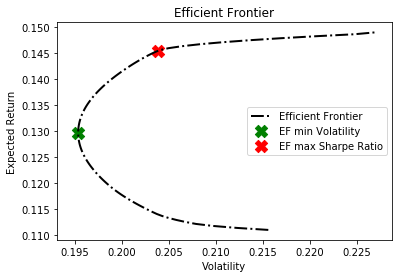

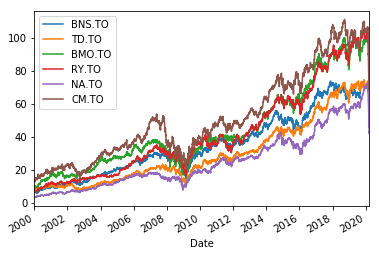

In [6]:
# Efficient Frontier for big banks for 2020-03-23
big_banks = ['BNS.TO', 'TD.TO', 'BMO.TO', 'RY.TO', 'NA.TO', 'CM.TO']
start_date = datetime.datetime(2000, 1, 1)
end_date = datetime.datetime(2020, 3, 23)
big_banks_pf = build_portfolio(names=big_banks, start_date=start_date, end_date=end_date, data_api="yfinance")
print(f"the weights for maximum sharpe ratio = {big_banks_pf.ef_maximum_sharpe_ratio(verbose=False)}")
print(f"the weights for minimum volatility = {big_banks_pf.ef_minimum_volatility(verbose=False)}")

big_banks_pf.ef_plot_efrontier()
# adding markers to optimal solutions
big_banks_pf.ef_plot_optimal_portfolios()
# perform visualization on prices on big banks
big_banks_pf.data.plot()
plt.show()

[*********************100%***********************]  6 of 6 completed
the weights for maximum sharpe ratio =           Allocation
BNS.TO  9.394904e-18
TD.TO   0.000000e+00
BMO.TO  0.000000e+00
RY.TO   4.261905e-01
NA.TO   5.738095e-01
CM.TO   0.000000e+00
the weights for minimum volatility =         Allocation
BNS.TO    0.160624
TD.TO     0.190896
BMO.TO    0.147857
RY.TO     0.221543
NA.TO     0.239888
CM.TO     0.039192


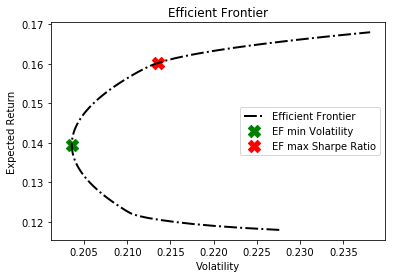

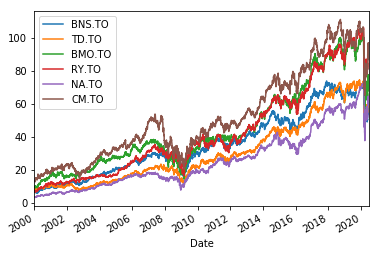

In [7]:
# Efficient Frontier for big banks for 2020-06-30
big_banks = ['BNS.TO', 'TD.TO', 'BMO.TO', 'RY.TO', 'NA.TO', 'CM.TO']
start_date = datetime.datetime(2000, 1, 1)
end_date = datetime.datetime(2020, 6, 30)
big_banks_pf = build_portfolio(names=big_banks, start_date=start_date, end_date=end_date, data_api="yfinance")
print(f"the weights for maximum sharpe ratio = {big_banks_pf.ef_maximum_sharpe_ratio(verbose=False)}")
print(f"the weights for minimum volatility = {big_banks_pf.ef_minimum_volatility(verbose=False)}")

big_banks_pf.ef_plot_efrontier()
# adding markers to optimal solutions
big_banks_pf.ef_plot_optimal_portfolios()
# perform visualization on prices on big banks
big_banks_pf.data.plot()
plt.show()

[*********************100%***********************]  6 of 6 completed
the weights for maximum sharpe ratio =           Allocation
BNS.TO  2.358986e-02
TD.TO   1.127570e-17
BMO.TO  4.038981e-02
RY.TO   3.410324e-01
NA.TO   5.949879e-01
CM.TO   5.610746e-18
the weights for minimum volatility =         Allocation
BNS.TO    0.151400
TD.TO     0.185197
BMO.TO    0.194447
RY.TO     0.144501
NA.TO     0.292637
CM.TO     0.031818


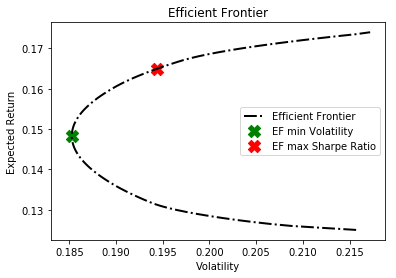

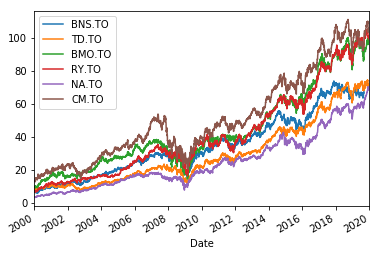

In [8]:
# Efficient Frontier for big banks for 2020-01-01
big_banks = ['BNS.TO', 'TD.TO', 'BMO.TO', 'RY.TO', 'NA.TO', 'CM.TO']
start_date = datetime.datetime(2000, 1, 1)
end_date = datetime.datetime(2020, 1, 1)
big_banks_pf = build_portfolio(names=big_banks, start_date=start_date, end_date=end_date, data_api="yfinance")
print(f"the weights for maximum sharpe ratio = {big_banks_pf.ef_maximum_sharpe_ratio(verbose=False)}")
print(f"the weights for minimum volatility = {big_banks_pf.ef_minimum_volatility(verbose=False)}")

big_banks_pf.ef_plot_efrontier()
# adding markers to optimal solutions
big_banks_pf.ef_plot_optimal_portfolios()
# perform visualization on prices on big banks
big_banks_pf.data.plot()
plt.show()

## 3.3 Monte Carlo Simulation and Maximum Sharpe Ratio

----------------------------------------------------------------------
Optimised portfolio for Minimum Volatility

Time period: 252 days
Expected return: 0.139
Volatility: 0.183
Sharpe Ratio: 0.733

Optimal weights:
               LB.TO    CWB.TO    EQB.TO    HCG.TO
Allocation  0.524627  0.226803  0.237336  0.011234
----------------------------------------------------------------------
Optimised portfolio for Maximum Sharpe Ratio

Time period: 252 days
Expected return: 0.149
Volatility: 0.189
Sharpe Ratio: 0.759

Optimal weights:
              LB.TO    CWB.TO    EQB.TO    HCG.TO
Allocation  0.35593  0.279171  0.282987  0.081912
----------------------------------------------------------------------


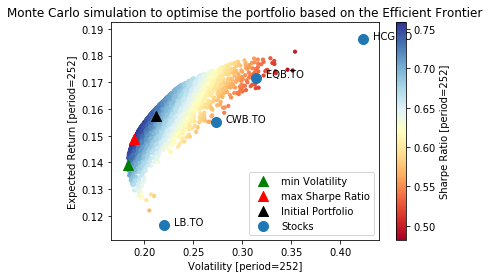

In [9]:
# Perform a Monte Carlo run to find the portfolio with the minimum volatility and maximum Sharpe Ratio
# for small banks
opt_w, opt_res = small_banks_pf.mc_optimisation(num_trials=5000)
small_banks_pf.mc_properties()
small_banks_pf.mc_plot_results()
# show the individual stocks
small_banks_pf.plot_stocks()
plt.show()

----------------------------------------------------------------------
Optimised portfolio for Minimum Volatility

Time period: 252 days
Expected return: 0.147
Volatility: 0.185
Sharpe Ratio: 0.768

Optimal weights:
              BNS.TO     TD.TO    BMO.TO     RY.TO     NA.TO     CM.TO
Allocation  0.174231  0.179323  0.190977  0.144263  0.263912  0.047293
----------------------------------------------------------------------
Optimised portfolio for Maximum Sharpe Ratio

Time period: 252 days
Expected return: 0.159
Volatility: 0.190
Sharpe Ratio: 0.809

Optimal weights:
              BNS.TO     TD.TO    BMO.TO     RY.TO    NA.TO    CM.TO
Allocation  0.041777  0.112245  0.009752  0.349107  0.45949  0.02763
----------------------------------------------------------------------


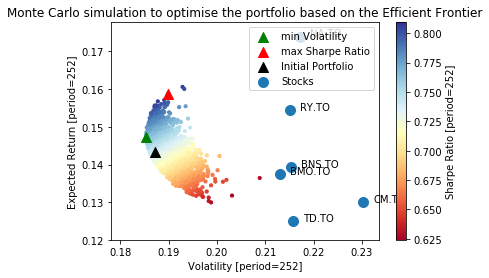

In [10]:
# Perform a Monte Carlo run to find the portfolio with the minimum volatility and maximum Sharpe Ratio
# for big banks
opt_w, opt_res = big_banks_pf.mc_optimisation(num_trials=5000)
big_banks_pf.mc_properties()
big_banks_pf.mc_plot_results()
# show the individual stocks
big_banks_pf.plot_stocks()
plt.show()

## 3.4 Stock Returns for Big and Small Bank Groups

The big bank groups are BNS, TD, BMO, Royal Bank of Canada, National Bank and Canadian Imperial Bank of Commerce.
The small bank groups include LB (Laurientian Bank),CWB(Canadian Western Bank), EQB(EQ Bank), HCG(Home Capital Group)

In [11]:
# Plot stock returns for big bank groups
start_date = datetime.datetime(2020, 1, 1)
end_date = datetime.datetime(2020, 6, 30)
big_banks_pf = build_portfolio(names=big_banks, start_date=start_date, end_date=end_date, data_api="yfinance")
big_banks_return=big_banks_pf.data.pct_change()
big_banks_return['average'] = big_banks_return.mean(numeric_only=True, axis=1)
big_banks_return= (1 + big_banks_return.fillna(0)).cumprod()
big_banks_return.hvplot(x='Date', y=['BNS.TO', 'TD.TO', 'BMO.TO','RY.TO','NA.TO','CM.TO'],
             value_label='Big Bank Stock Evolution through COVID',figsize=(600,1200))

[*********************100%***********************]  6 of 6 completed


:NdOverlay   [Variable]
   :Curve   [Date]   (Big Bank Stock Evolution through COVID)

In [12]:
# Plot stock returns for small bank groups
start_date = datetime.datetime(2020, 1, 1)
end_date = datetime.datetime(2020, 6, 30)
small_banks_pf = build_portfolio(names=small_banks, start_date=start_date, end_date=end_date, data_api="yfinance")
small_banks_return=small_banks_pf.data.pct_change()
small_banks_return['average'] = small_banks_return.mean(numeric_only=True, axis=1)
small_banks_return= (1 + small_banks_return.fillna(0)).cumprod()
small_banks_return.hvplot(x='Date', y=['LB.TO', 'CWB.TO', 'EQB.TO','HCG.TO'],
             value_label='Small Stock Evolution through COVID',figsize=(600,1200))


[*********************100%***********************]  4 of 4 completed


:NdOverlay   [Variable]
   :Curve   [Date]   (Small Stock Evolution through COVID)

In [13]:
# Plot small banks' stock price return along with that of big banks
consol_banks=pd.DataFrame(columns=['Big Banks','Small Banks'],index=big_banks_return.index)
consol_banks['Big Banks']=big_banks_return['average'].copy()
consol_banks['Small Banks']=small_banks_return['average'].copy()
plot_banks=consol_banks.hvplot(x='Date', y=['Big Banks','Small Banks'],
             value_label='COVID impact on small vs big banks',legend='top', grid=True,height=500, width=700)
plot_banks

:NdOverlay   [Variable]
   :Curve   [Date]   (COVID impact on small vs big banks)

## 3.5 Volatility Analysis on VIX Portfolio 

In [14]:
# Build VIX portfolio
start_date = datetime.datetime(2020, 1, 1)
end_date = datetime.datetime(2020, 6, 30)
vix=['^VIX']
VIX = build_portfolio(names=vix, start_date=start_date, end_date=end_date, data_api="yfinance")
VIX_DF=VIX.data
consol_banks['VIX']=VIX_DF['^VIX']

[*********************100%***********************]  1 of 1 completed


In [15]:
# Plot VIX during the COV-19 period
trace1 = go.Line(
    x=consol_banks.index,
    y=consol_banks['Big Banks'],
    name='Big Bank Stocks',
    marker=dict(
        color='rgb(34,163,192)'
               )
)
trace2 = go.Line(
    x=consol_banks.index,
    y=consol_banks['Small Banks'],
    name='Small Bank Stocks',
    marker=dict(
        color='rgb(60,100,102)'
               )
)
trace3 = go.Bar(
    x=consol_banks.index,
    y=consol_banks['VIX'],
    name='VIX'
)

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.add_trace(trace3,secondary_y=True)
fig['layout'].update(height = 600, width = 800, title = "VIX",xaxis=dict(
      tickangle=-90
    ))
fig.show()

/Users/shiqihu/opt/anaconda3/envs/pyvizenv/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:385: DeprecationWarning: plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.

  DeprecationWarning,


In [16]:
#Plot VIX since 2008 to compare volatility spikes
start_date = datetime.datetime(2000, 1, 1)
end_date = datetime.datetime(2020, 6, 30)
vix=['^VIX']
vix = build_portfolio(names=vix, start_date=start_date, end_date=end_date, data_api="yfinance")
VIX_Hist=vix.data
plot_vix_hist=VIX_Hist.hvplot.area(x='Date', y=['^VIX'], stacked=False,
                legend='bottom_right', height=400, width=800,title="Volatility Spike Comprable to 08 Crisis")
plot_vix_hist

[*********************100%***********************]  1 of 1 completed


:Area   [Date]   (^VIX)

In [17]:
start_date = datetime.datetime(2019, 1, 1)
end_date = datetime.datetime(2020, 6, 30)
SPX=['^GSPC']
SPX = build_portfolio(names=SPX, start_date=start_date, end_date=end_date, data_api="yfinance")
SPX_Hist=SPX.data

time_series = SPX_Hist['^GSPC']
indices = find_peaks(time_series, threshold=10)[0]

fig = go.Figure()
fig.add_trace(go.Scatter(
    y=time_series,
    mode='lines',
    name='S&P 500'
))

fig.add_trace(go.Scatter(
    x=indices,
    y=[time_series[j] for j in indices],
    mode='markers',
    marker=dict(
        size=8,
        color='red',
        symbol='cross'
    ),
    name='Local Peaks'
))
fig.update_layout(
    title_text='S&P 500 from Jan 2019.Local peaks in 2020 highlight volatility'
)
fig.show()

[*********************100%***********************]  1 of 1 completed


In [18]:
start_date = datetime.datetime(2000, 1, 1)
end_date = datetime.datetime(2020, 6, 30)
SPX=['^GSPC']
SPX = build_portfolio(names=SPX, start_date=start_date, end_date=end_date, data_api="yfinance")
SPX_Hist=SPX.data
xs = SPX_Hist['^GSPC']
# Calculations for first drawdown (CORONA)
array=(np.maximum.accumulate(xs) - xs)
i = np.argmax(array) # end of the period
j = np.argmax(xs[:i]) # start of period

# Calculations for second drawdown (2008 Crisis)
array2=array.copy()
array2[j:i]=0
array2[i:]=0
i2 = np.argmax(array2) # end of the period
j2 = np.argmax(xs[:i2]) # start of period

# Calculations for third drawdown (Dotcom bubble and 9/11)
array3=array2.copy()
array3[j2:i2]=0
array3[i2:]=0
i3 = np.argmax(array3) # end of the period
j3 = np.argmax(xs[:i3]) # start of period


#Emergency code to use matplotlib if HVPLOT does not work
#plt.plot(xs)
#plt.plot([i, j], [xs[i], xs[j]], 'o', color='Red', markersize=10)
#plt.plot([i2, j2], [xs[i2], xs[j2]], 'o', color='Blue', markersize=10)

# Using GO 
fig = go.Figure()
fig.add_trace(go.Scatter(
    y=xs,
    x=SPX_Hist.index,
    mode='lines',
    name='S&P 500'
))

fig.add_trace(go.Scatter(
    x=[i, j],
    y=[xs[i], xs[j]],
    mode='markers',
    marker=dict(
        size=8,
        color='red',
        symbol='cross'
    ),
    name='Corona Drawdown'
))
fig.add_trace(go.Scatter(
    x=[i2, j2],
    y=[xs[i2], xs[j2]],
    mode='markers',
    marker=dict(
        size=8,
        color='red',
        symbol='x'
    ),
    name='2008 GFC Drawdown'
))
fig.add_trace(go.Scatter(
    x=[i3, j3],
    y=[xs[i3], xs[j3]],
    mode='markers',
    marker=dict(
        size=8,
        color='red',
        symbol='diamond'
    ),
    name='Dotcom burst and 9/11'
))
fig.update_layout(
    title_text='S&P 500: drawdown comparison'
)
fig.show()

[*********************100%***********************]  1 of 1 completed


/Users/shiqihu/opt/anaconda3/envs/pyvizenv/lib/python3.7/site-packages/numpy/core/fromnumeric.py:61: FutureWarning:


The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.

